In [ ]:
import os
import sys
sys.path.append(os.path.dirname(os.path.dirname(__file__)))
from configs.config2 import * # directories + constants

import mne
import matplotlib
import joblib
import mne
import numpy as np

import matplotlib.pyplot as plt
mne.viz.set_browser_backend('matplotlib')

'tmp_potatos_output.pkl'   : normal settings with p_thres = 0.01
'tmp_potatos_output_2.pkl' : normal settings with p_thres = 0.001
'tmp_potatos_output_3.pkl' : PotatoFiled only, but differnt p_thres and z_thres

tmp_potatos:output:



### Functions

In [ ]:
def _check_if_list(list1, list2):
	if not isinstance(list1, list):
		list1 = [list1]
	if not isinstance(list2, list):
		list2 = [list2]
	return list1, list2

def _in1not2(list1, list2):
	list1, list2 = _check_if_list(list1, list2)
	return [np.sort(list(set(l1).difference(set(l2)))) for l1, l2 in zip(list1, list2)]

def _in1or2(list1, list2):
	list1, list2 = _check_if_list(list1, list2)
	return [np.sort(list(set(l1) | set(l2))) for l1, l2 in zip(list1, list2)]

def _in1and2(list1, list2):
	list1, list2 = _check_if_list(list1, list2)
	return [np.sort(list(set(l1) & set(l2))) for l1, l2 in zip(list1, list2)]

def get_data(subjectID):

	inFolder = 'epochs_clean/ica'

	inFile =f'{CODE_DIR}/tmp_potatos_output.pkl'
	potatos = joblib.load(inFile)
	trls =  potatos[subjectID]['bad_idx']


	epochsFile_unclean = f'{MEG_DATA_DIR}/{inFolder}/{subjectID}/{subjectID}_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif'
	epochs = mne.read_epochs(epochsFile_unclean, preload=True)

	idx_lwf = trls[0:4]
	idx_oas = trls[4:8]

	lwf_not_oas = _in1not2(idx_lwf, idx_oas)
	oas_not_lwf = _in1not2(idx_oas, idx_lwf)

	lwf_or_oas =  _in1or2(idx_lwf, idx_oas)
	lwf_and_oas = _in1and2(idx_lwf, idx_oas)

	for i, (descr, lwf, oas, lwf_only, oas_only, l_or_o, l_and_o) in enumerate(zip(list_descriptors, idx_lwf, idx_oas, lwf_not_oas, oas_not_lwf, lwf_or_oas, lwf_and_oas)):
		print(f'List {i}: {descr}')
		print(f'\tLWF:\t\t {len(lwf)}')
		print(f'\tOAS:\t\t {len(oas)}')
		print(f'\tLWF not in OAS:\t {len(lwf_only)}')
		print(f'\tOAS not in LWF:\t {len(oas_only)}')
		print(f'\tLWF or OAS:\t {len(l_or_o)}')
		print(f'\tLWF and OAS:\t {len(l_and_o)}')
		print('---')

	return epochs, idx_lwf, idx_oas, lwf_not_oas, oas_not_lwf, lwf_or_oas, lwf_and_oas


def get_data_2(subjectID):
	# onstad of comparing lwf and oas, we focus on comparing mag, grad and PotatoFiled (mag+grad)
	list_descriptors = ['LWF', 'OAS']
	
	inFolder = 'epochs_clean/ica'
	inFile =f'{CODE_DIR}/tmp_potatos_output.pkl'
	potatos = joblib.load(inFile)
	trls =  potatos[subjectID]['bad_idx']

	epochsFile_unclean = f'{MEG_DATA_DIR}/{inFolder}/{subjectID}/{subjectID}_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif'
	epochs = mne.read_epochs(epochsFile_unclean, preload=True)

	idx_lwf = trls[0:4]
	idx_oas = trls[4:8]

	idx_mag = [idx_lwf[1], idx_oas[1]]
	idx_grad = [idx_lwf[2], idx_oas[2]]
	idx_field = [idx_lwf[0], idx_oas[0]]

	idx_mag_grad = _in1or2(idx_mag, idx_grad)
	
	idx_mag_only =  _in1not2(idx_mag, idx_grad)
	idx_grad_only = _in1not2(idx_grad, idx_mag)
	idx_field_only = _in1not2(idx_field, _in1or2(idx_mag, idx_grad))

	for i, (descr, mag, grad, potatoF, mag_only, grad_only, field_only) in enumerate(
		zip(list_descriptors, idx_mag, idx_grad, idx_field, idx_mag_only, idx_grad_only, idx_field_only)):
		print(f'List {i}: {descr}')
		print(f'\tmag:\t\t {len(mag)}')
		print(f'\tgrad:\t\t {len(grad)}')
		print(f'\tpotatoField:\t {len(potatoF)}')
		print(f'\tmag only:\t\t {len(mag_only)}')
		print(f'\tgrad only:\t\t {len(grad_only)}')
		print(f'\tpotatoField only:\t {len(field_only)}')
		print('---')

	return epochs, idx_mag, idx_grad, idx_field, idx_mag_grad, idx_mag_only, idx_grad_only, idx_field_only


def get_data_3(subjectID, fileNr = 3):
	# onstad of comparing lwf and oas, we focus on comparing mag, grad and PotatoFiled (mag+grad)
	list_descriptors = ['LWF', 'OAS']
	
	inFolder = 'epochs_ica'
	inFile = f'{CODE_DIR}/tmp_potatos_output_{fileNr}.pkl'
	potatos = joblib.load(inFile)
	trls =  potatos[subjectID]['bad_idx']

	# append orignal potato results to compare with our new settings
	inFile_std = f'{CODE_DIR}/tmp_potatos_output.pkl'
	potatos_std = joblib.load(inFile_std)
	trls_std =  potatos_std[subjectID]['bad_idx']
	idx_lwf_std = trls_std[0]
	idx_oas_std = trls_std[4]

	potatos_std[subjectID]['settings'][0]['z_threshold']

	epochsFile_unclean = f'{MEG_DATA_DIR}/{inFolder}/{subjectID}/{subjectID}_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif'
	epochs = mne.read_epochs(epochsFile_unclean, preload=True)

	info_z = ["z_thres: 3"] + [f"z_thres: {info['z_threshold']}" for info in potatos[subjectID]['settings'][0:3]]
	info_p = ["p_thres: 0.01"] + [f"p_thres: {info['p_threshold']}" for info in potatos[subjectID]['settings'][0:3]]

	# info_z = [f"z_thres: {potatos_std[subjectID]['settings'][0]['z_threshold']}"] + [f"z_thres: {info['z_threshold']}" for info in potatos[subjectID]['settings'][0:3]]
	# info_p = [f"p_thres: {potatos_std[subjectID]['settings'][0]['p_threshold']}"] + [f"p_thres: {info['p_threshold']}" for info in potatos[subjectID]['settings'][0:3]]

	idx_lwf = trls[0:3]
	idx_oas = trls[3:6]
	idx_lwf.insert(0, idx_lwf_std)
	idx_oas.insert(0, idx_oas_std)

	for descr, idxs in zip(list_descriptors, [idx_lwf, idx_oas]):
		print(f'{descr}:')
		for n, (idx, z, p) in enumerate(zip(idxs, info_z, info_p)):
			print(f'\t[{n}]: z = {z}\t p = {p}:\t\t {len(idx)}')
		print('---')

	return epochs, idx_lwf, idx_oas


# def get_data_4(subjectID, fileNr = 4):
# 	# onstad of comparing lwf and oas, we focus on comparing mag, grad and PotatoFiled (mag+grad)
# 	list_descriptors = ['LWF', 'OAS']
	
# 	inFolder = 'epochs_ica'
# 	inFile = f'{CODE_DIR}/tmp_potatos_output_{fileNr}.pkl'
# 	potatos = joblib.load(inFile)
# 	trls =  potatos[subjectID]['bad_idx']

# 	# append orignal potato results to compare with our new settings
# 	inFile_std = '{CODE_DIR}/tmp_potatos_output.pkl'
# 	potatos_std = joblib.load(inFile_std)
# 	trls_std =  potatos_std[subjectID]['bad_idx']
# 	idx_lwf_std = trls_std[0]
# 	idx_oas_std = trls_std[4]

# 	epochsFile_unclean = f'{MEG_DATA_DIR}r_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif'
# 	epochs = mne.read_epochs(epochsFile_unclean, preload=True)

# 	info_z = ["z_thres: 3"] + [f"z_thres: {info['z_threshold']}" for info in potatos[subjectID]['settings'][0:3]]
# 	info_p = ["p_thres: 0.01"] + [f"p_thres: {info['p_threshold']}" for info in potatos[subjectID]['settings'][0:3]]

# 	idx_lwf = trls[0:3]
# 	idx_oas = trls[3:6]
# 	idx_lwf.insert(0, idx_lwf_std)
# 	idx_oas.insert(0, idx_oas_std)

# 	for descr, idxs in zip(list_descriptors, [idx_lwf, idx_oas]):
# 		print(f'{descr}:')
# 		for n, (idx, z, p) in enumerate(zip(idxs, info_z, info_p)):
# 			print(f'\t[{n}]: z = {z}\t p = {p}:\t\t {len(idx)}')
# 		print('---')

# 	return epochs, idx_lwf, idx_oas

# def get_data_5(subjectID):
# 	# onstad of comparing lwf and oas, we focus on comparing mag, grad and PotatoFiled (mag+grad)
# 	list_descriptors = ['LWF', 'OAS']
	
# 	inFolder = 'epochs_ica'
# 	inFile = '{CODE_DIR}/tmp_potatos_output_5.pkl'
# 	potatos = joblib.load(inFile)
# 	trls =  potatos[subjectID]['bad_idx']

# 	# append orignal potato results to compare with our new settings
# 	inFile_std = '{CODE_DIR}/tmp_potatos_output.pkl'
# 	potatos_std = joblib.load(inFile_std)
# 	trls_std =  potatos_std[subjectID]['bad_idx']
# 	idx_lwf_std = trls_std[0]
# 	idx_oas_std = trls_std[4]

# 	epochsFile_unclean = f'{MEG_DATA_DIR}/{inFolder}/{subjectID}/{subjectID}_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif'
# 	epochs = mne.read_epochs(epochsFile_unclean, preload=True)

# 	info_z = ["z_thres: 3"] + [f"z_thres: {info['z_threshold']}" for info in potatos[subjectID]['settings'][0:3]]
# 	info_p = ["p_thres: 0.01"] + [f"p_thres: {info['p_threshold']}" for info in potatos[subjectID]['settings'][0:3]]

# 	idx_lwf = trls[0:3]
# 	idx_oas = trls[3:6]
# 	idx_lwf.insert(0, idx_lwf_std)
# 	idx_oas.insert(0, idx_oas_std)

# 	for descr, idxs in zip(list_descriptors, [idx_lwf, idx_oas]):
# 		print(f'{descr}:')
# 		for n, (idx, z, p) in enumerate(zip(idxs, info_z, info_p)):
# 			print(f'\t[{n}]: z = {z}\t p = {p}:\t\t {len(idx)}')
# 		print('---')

	return epochs, idx_lwf, idx_oas

def chunk_list(lst, n):
	return [lst[i:i+n] for i in range(0, len(lst), n)]

def plot_epochs(epochs, trls, chunk_size=8, n_chunk_lims=[0, 2]):
	for idx in chunk_list(trls, 8)[n_chunk_lims[0]:n_chunk_lims[1]]: 

		fig = epochs[idx].pick('meg').plot(n_epochs = chunk_size,
									 butterfly=True,
									show_scrollbars=False, 
									show=False, 
									show_scalebars=False
													)
		fig.set_figheight(2.5)
		fig.set_figwidth(15)

		ax = fig.axes[0]
		ax.set_xlabel('')

		for l in ax.findobj(matplotlib.lines.Line2D): # manually move everything so we can view it nicely
			c = l.get_color()
			if isinstance(c, np.ndarray):
				if  np.isclose(c[2], 0.54509804):
					l.set_ydata(np.array([x+0.3 for x in l.get_ydata()]))
				elif  np.isclose(c[2], 1):
					l.set_ydata(np.array([x-0.3 for x in l.get_ydata()]))

		ax.set_yticks([0.3, 0.7])
		ax.set_yticklabels(['mag', 'grad'])
		ax.set_ylim(1.5, -0.5)
	plt.show()

list_descriptors = ['PotatoField = True --> grads + mags, 2 potatoes, z=3',
					'PotatoField = False --> mags,  z=3',
					'PotatoField = False --> grads, z=3',
					'PotatoField = False --> mags, z=2']

subjectIDs = ['19840930bigs', '19960630cahi', '20021027sldn', '20000118sbnb']


In [ ]:

inFile =f'{CODE_DIR}/tmp_potatos_output.pkl'
potatos = joblib.load(inFile)

for subj in potatos.keys():
	print(subj)
	opt_list = potatos[subj]['info']
	infos = potatos[subj]['settings']

	fig, axs = plt.subplots(2, 4, figsize=(16, 8), constrained_layout=True)

	for ax, opt, info in zip(axs.flat, opt_list, infos):
		z_scores = opt['z_scores']
		ax.hist(z_scores, bins=50, edgecolor='black')
		ax.set_title(info.values())
		ax.set_xlabel("z_score")
		ax.set_ylabel("Frequency")
		ax.set_xlim([-3, 8])	
		ax.grid(True)
	for ax in axs.flat[len(opt_list):]:
		ax.set_visible(False)
		
	plt.show()


# Compare LWF and OAS

## subject 1

In [9]:
subjectID = subjectIDs[0]
epochs, idx_lwf, idx_oas, lwf_not_oas, oas_not_lwf, lwf_or_oas, lwf_and_oas = get_data(subjectID)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
List 0: PotatoField = True --> grads + mags, 2 potatoes, z=3
	LWF:		 114
	OAS:		 100
	LWF not in OAS:	 24
	OAS not in LWF:	 10
	LWF or OAS:	 124
	LWF and OAS:	 90
---
List 1: PotatoField = False --> mags,  z=3
	LW

### 1. PotatoField = True --> grads + mags


 --------------------- 
 lwf_not_oas (n = 24)
 --------------------- 
 


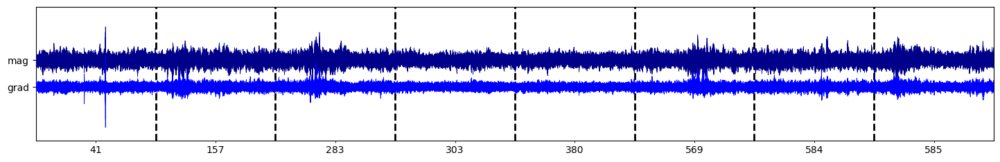

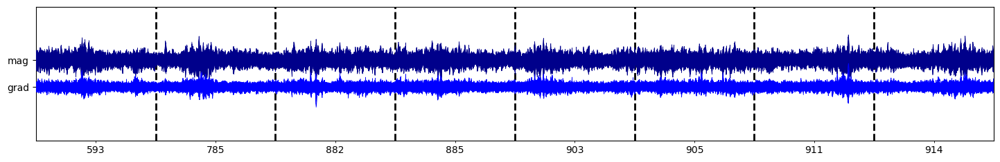


 --------------------- 
 oas_not_lwf(n = 10)
 --------------------- 
 


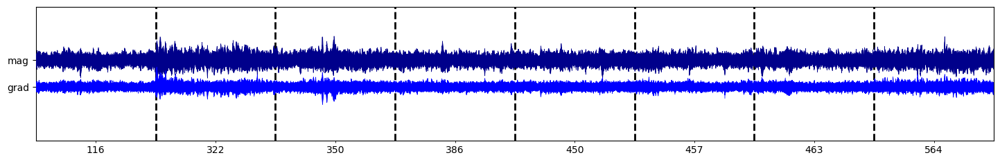

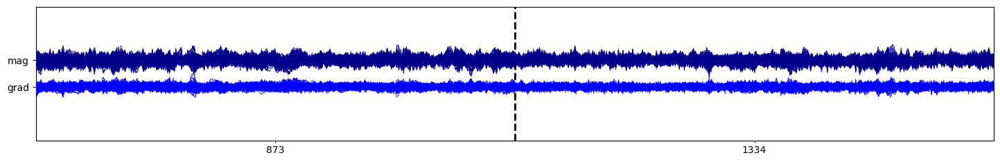


 --------------------- 
 lwf_and_oas(n = 90)
 --------------------- 
 


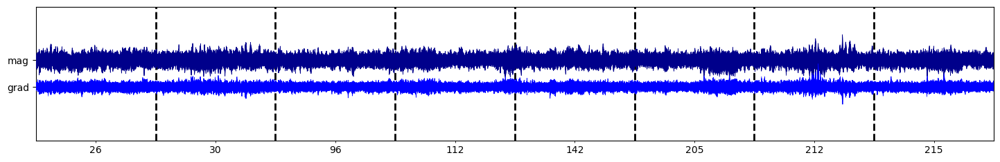

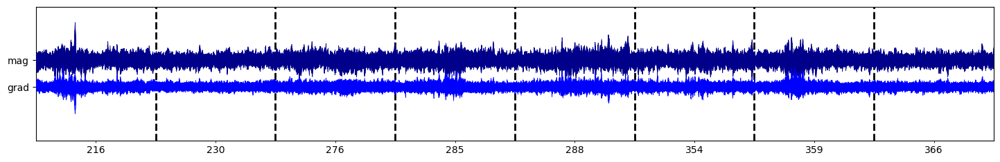

In [10]:
i=0
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])


### 2. Magnetometer only


 --------------------- 
 lwf_not_oas (n = 4)
 --------------------- 
 


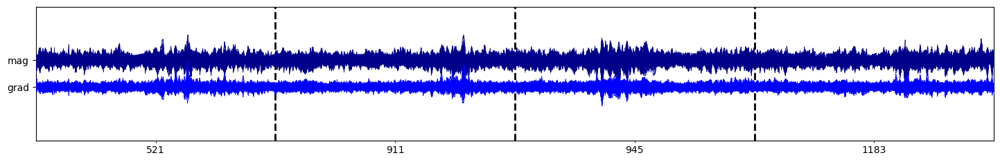


 --------------------- 
 oas_not_lwf(n = 4)
 --------------------- 
 


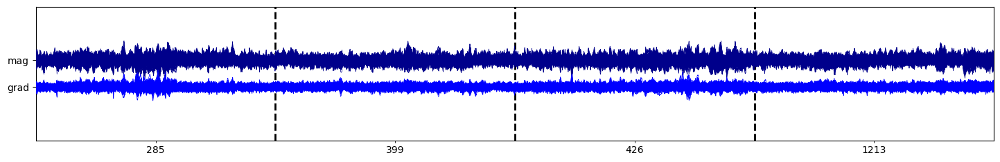


 --------------------- 
 lwf_and_oas(n = 40)
 --------------------- 
 


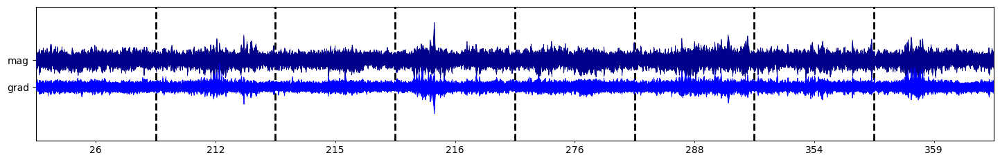

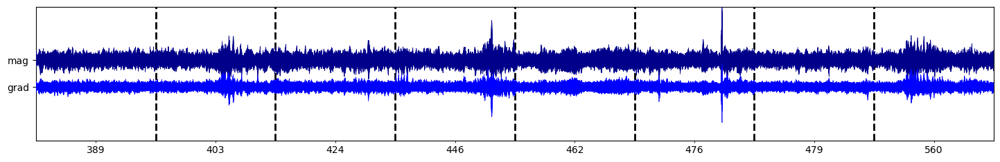

In [11]:
i=1
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])

### 3. Gradiometers only


 --------------------- 
 lwf_not_oas (n = 18)
 --------------------- 
 


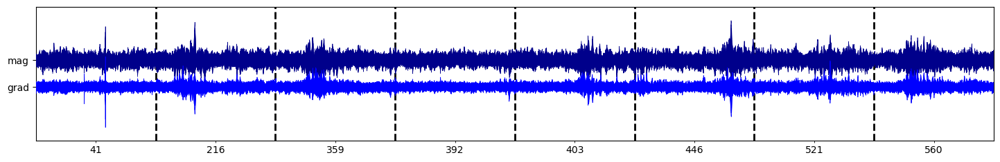

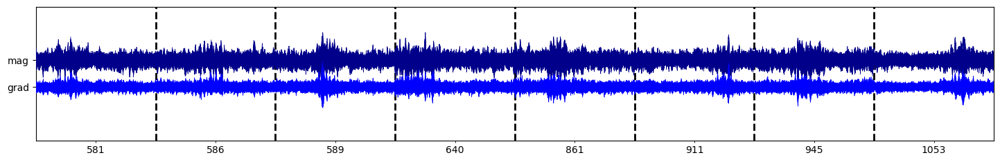


 --------------------- 
 oas_not_lwf(n = 4)
 --------------------- 
 


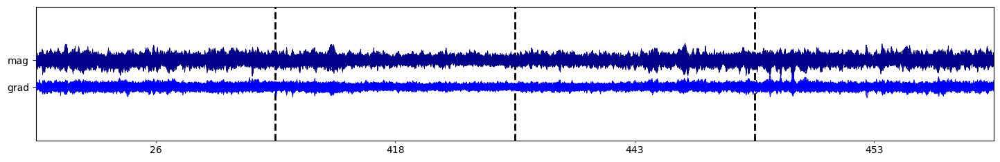


 --------------------- 
 lwf_and_oas(n = 22)
 --------------------- 
 


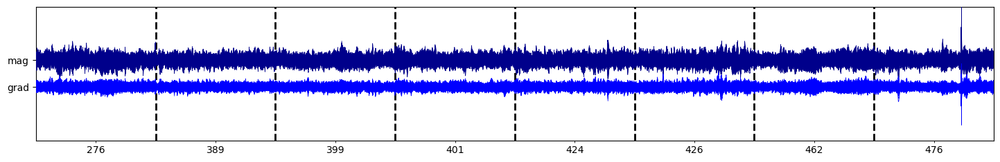

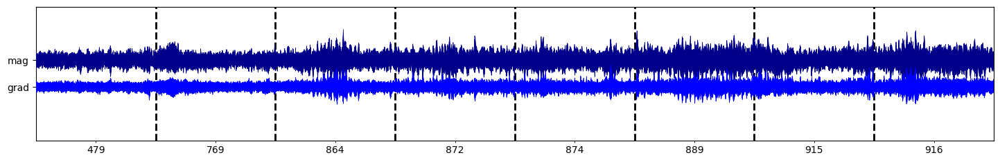

In [12]:
i=2
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])

## subject 2

In [13]:
subjectID = subjectIDs[1]
epochs, idx_lwf, idx_oas, lwf_not_oas, oas_not_lwf, lwf_or_oas, lwf_and_oas = get_data(subjectID)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19960630cahi/19960630cahi_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19960630cahi/19960630cahi_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19960630cahi/19960630cahi_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
List 0: PotatoField = True --> grads + mags, 2 potatoes, z=3
	LWF:		 84
	OAS:		 80
	LWF not in OAS:	 7
	OAS not in LWF:	 3
	LWF or OAS:	 87
	LWF and OAS:	 77
---
List 1: PotatoField = False --> mags,  z=3
	LWF:		 

### 1. PotatoField = True --> grads + mags


 --------------------- 
 lwf_not_oas (n = 7)
 --------------------- 
 


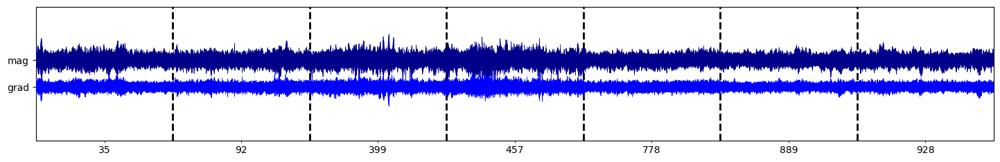


 --------------------- 
 oas_not_lwf(n = 3)
 --------------------- 
 


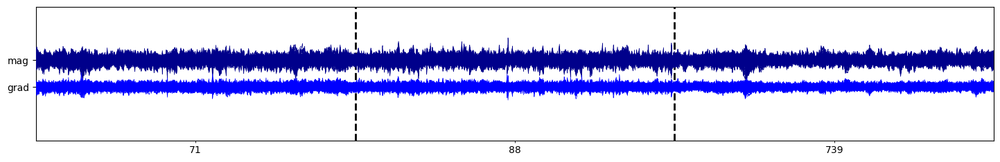


 --------------------- 
 lwf_and_oas(n = 77)
 --------------------- 
 


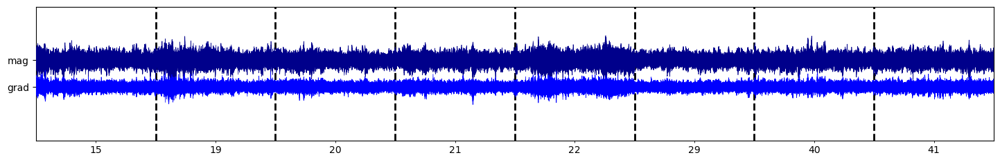

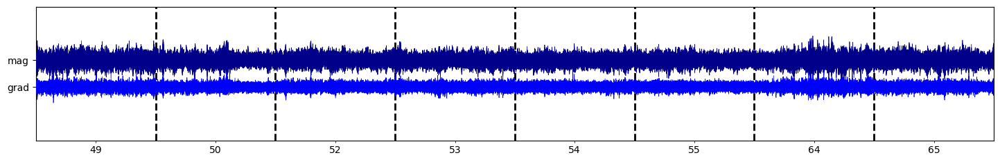

In [14]:
i=0
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])


### 2. Magnetometer only


 --------------------- 
 lwf_not_oas (n = 1)
 --------------------- 
 


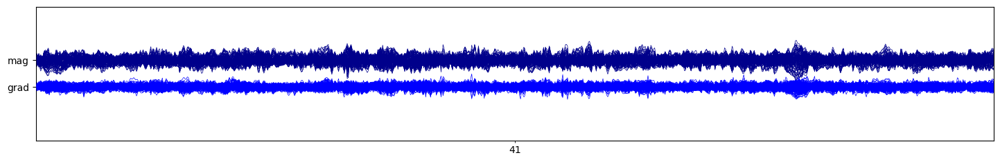


 --------------------- 
 oas_not_lwf(n = 1)
 --------------------- 
 


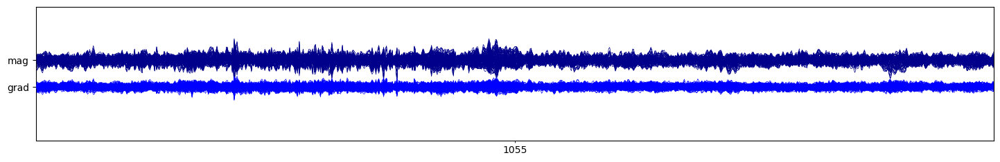


 --------------------- 
 lwf_and_oas(n = 14)
 --------------------- 
 


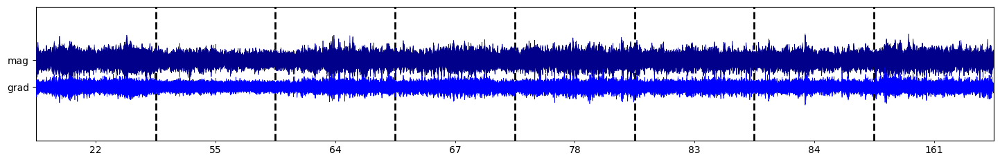

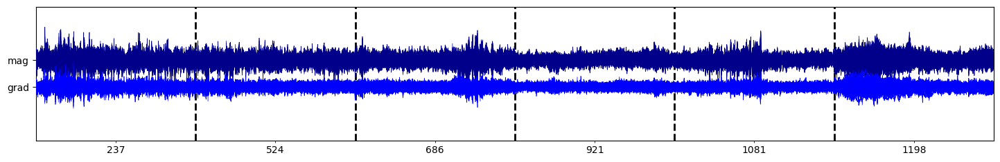

In [15]:
i=1
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])

### 3. Gradiometers only


 --------------------- 
 lwf_not_oas (n = 2)
 --------------------- 
 


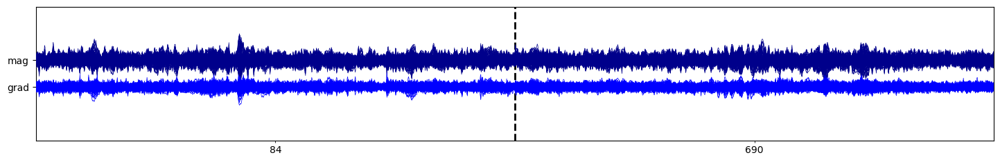


 --------------------- 
 oas_not_lwf(n = 1)
 --------------------- 
 


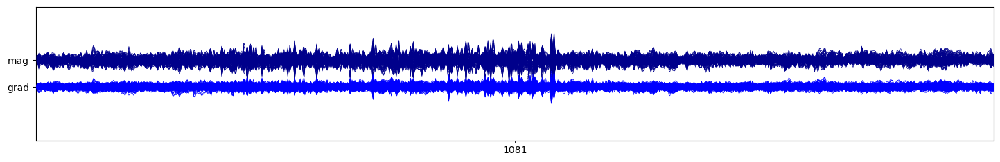


 --------------------- 
 lwf_and_oas(n = 10)
 --------------------- 
 


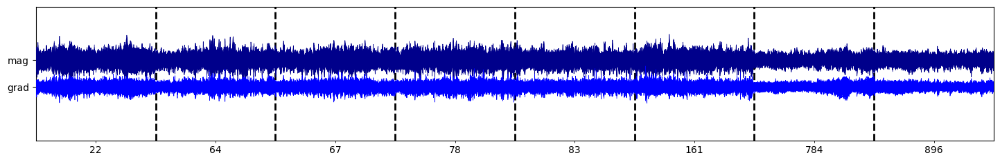

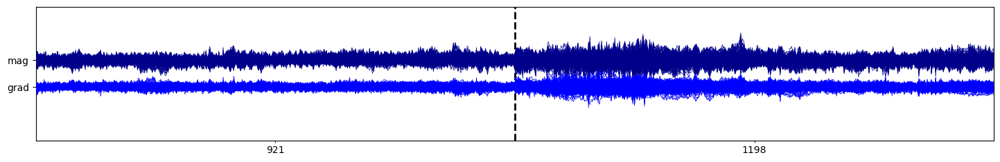

In [16]:
i=2
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])

## subject 3

In [17]:
subjectID = subjectIDs[2]
epochs, idx_lwf, idx_oas, lwf_not_oas, oas_not_lwf, lwf_or_oas, lwf_and_oas = get_data(subjectID)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
List 0: PotatoField = True --> grads + mags, 2 potatoes, z=3
	LWF:		 132
	OAS:		 121
	LWF not in OAS:	 19
	OAS not in LWF:	 8
	LWF or OAS:	 140
	LWF and OAS:	 113
---
List 1: PotatoField = False --> mags,  z=3
	LW

### 1. PotatoField = True --> grads + mags


 --------------------- 
 lwf_not_oas (n = 19)
 --------------------- 
 


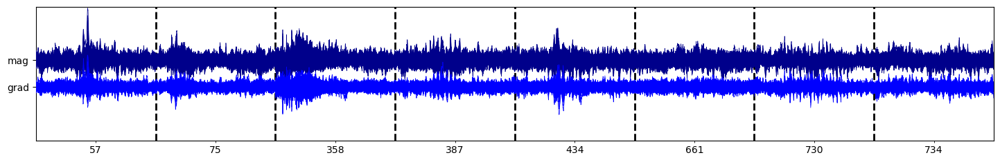

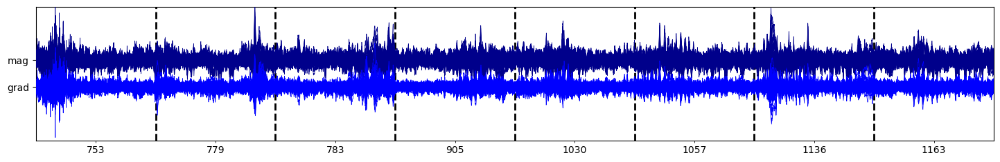


 --------------------- 
 oas_not_lwf(n = 8)
 --------------------- 
 


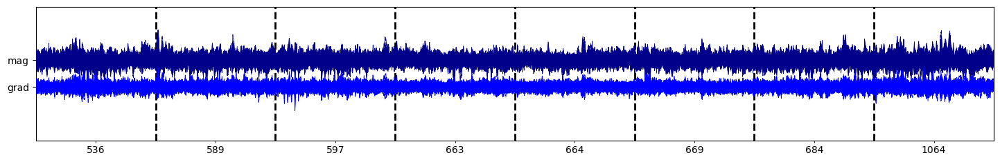


 --------------------- 
 lwf_and_oas(n = 113)
 --------------------- 
 


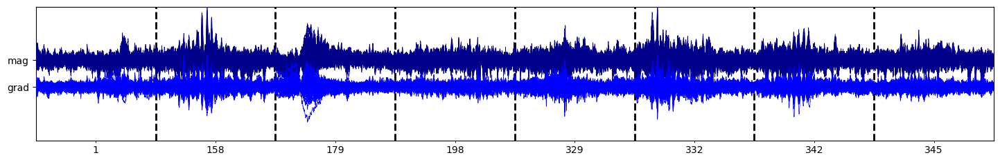

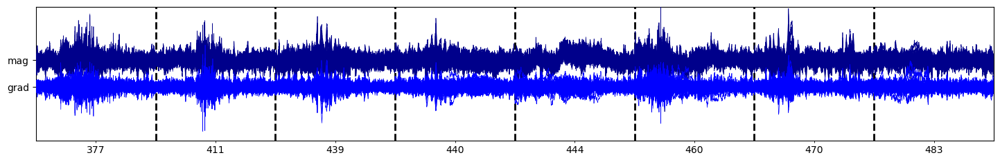

In [18]:
i=0
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])


### 2. Magnetometer only


 --------------------- 
 lwf_not_oas (n = 12)
 --------------------- 
 


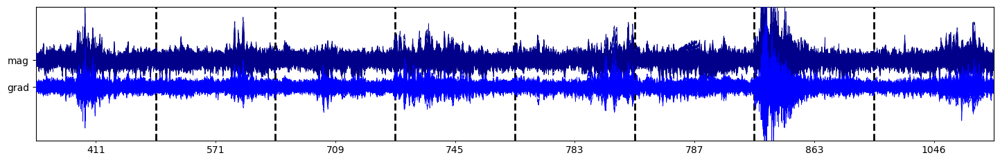

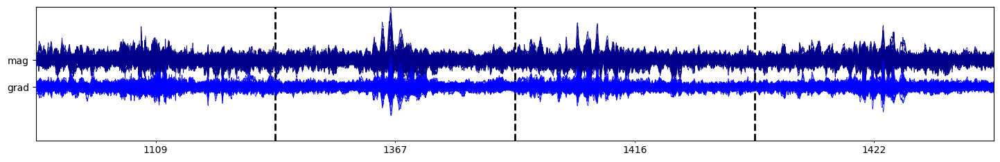


 --------------------- 
 oas_not_lwf(n = 0)
 --------------------- 
 

 --------------------- 
 lwf_and_oas(n = 59)
 --------------------- 
 


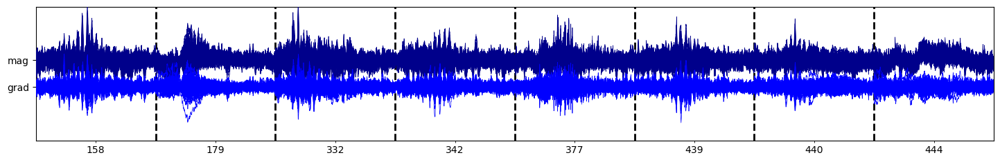

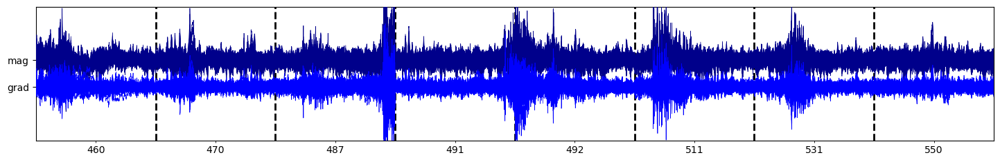

In [19]:
i=1
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])

### 3. Gradiometers only


 --------------------- 
 lwf_not_oas (n = 18)
 --------------------- 
 


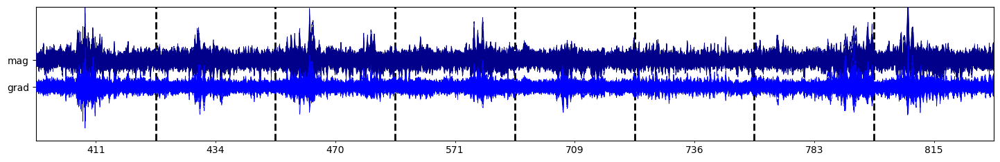

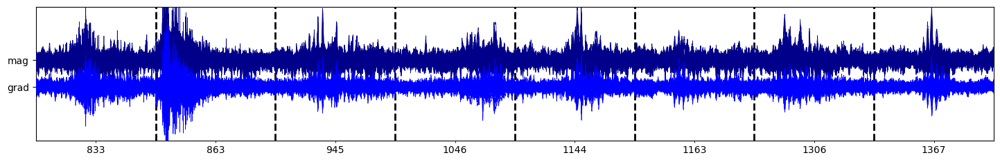


 --------------------- 
 oas_not_lwf(n = 3)
 --------------------- 
 


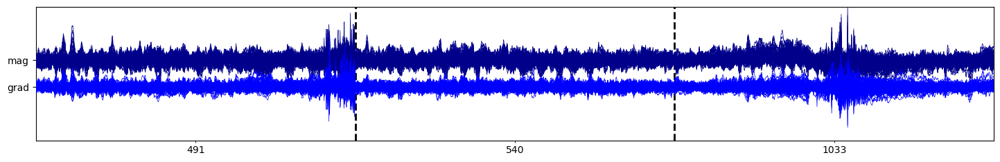


 --------------------- 
 lwf_and_oas(n = 42)
 --------------------- 
 


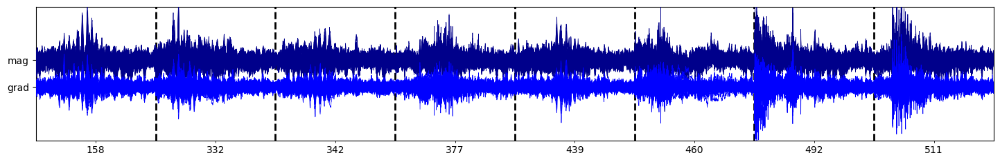

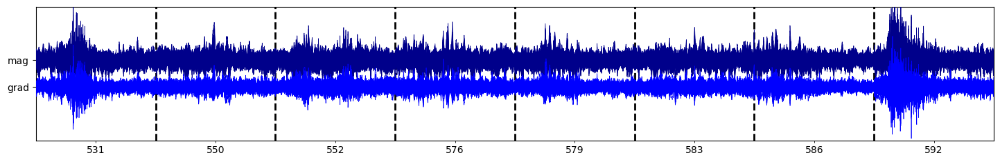

In [20]:
i=2
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])

## subject 4

In [21]:
subjectID = subjectIDs[3]
epochs, idx_lwf, idx_oas, lwf_not_oas, oas_not_lwf, lwf_or_oas, lwf_and_oas = get_data(subjectID)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20000118sbnb/20000118sbnb_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20000118sbnb/20000118sbnb_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20000118sbnb/20000118sbnb_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
List 0: PotatoField = True --> grads + mags, 2 potatoes, z=3
	LWF:		 159
	OAS:		 141
	LWF not in OAS:	 25
	OAS not in LWF:	 7
	LWF or OAS:	 166
	LWF and OAS:	 134
---
List 1: PotatoField = False --> mags,  z=3
	LW

### 1. PotatoField = True --> grads + mags


 --------------------- 
 lwf_not_oas (n = 25)
 --------------------- 
 


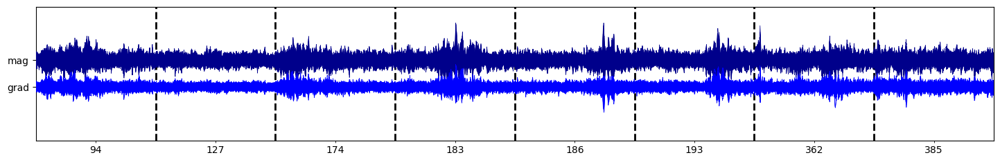

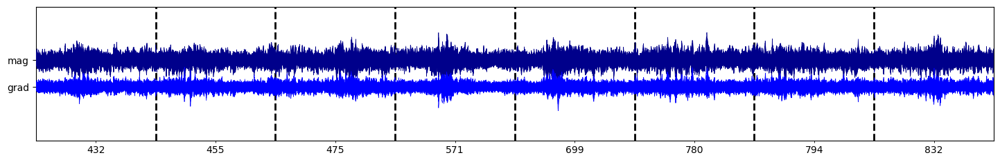


 --------------------- 
 oas_not_lwf(n = 7)
 --------------------- 
 


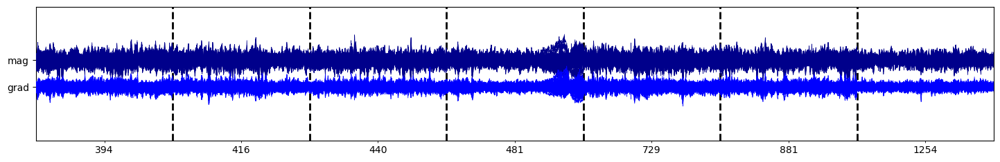


 --------------------- 
 lwf_and_oas(n = 134)
 --------------------- 
 


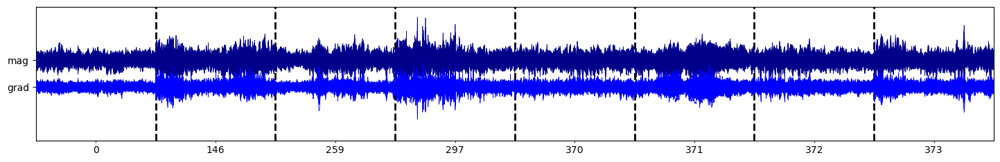

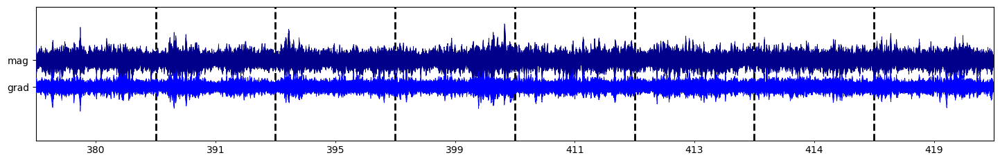

In [22]:
i=0
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])


### 2. Magnetometer only


 --------------------- 
 lwf_not_oas (n = 11)
 --------------------- 
 


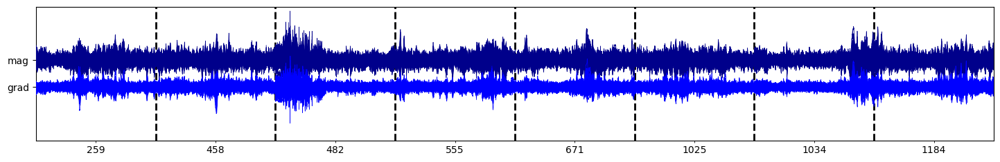

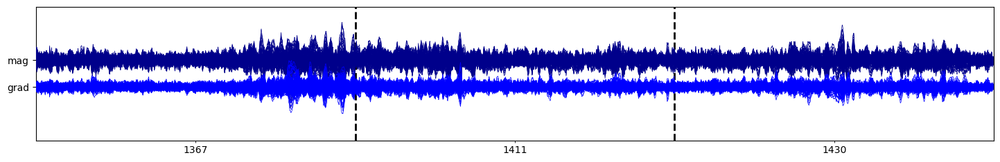


 --------------------- 
 oas_not_lwf(n = 2)
 --------------------- 
 


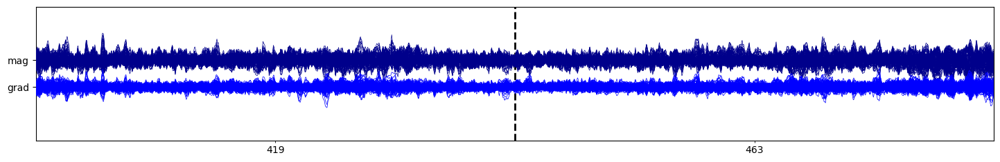


 --------------------- 
 lwf_and_oas(n = 63)
 --------------------- 
 


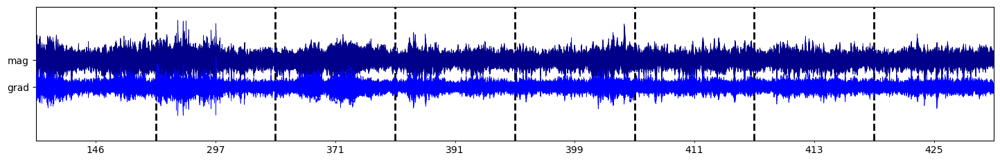

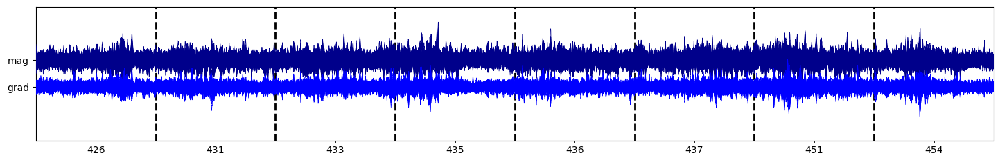

In [23]:
i=1
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])

### 3. Gradiometers only


 --------------------- 
 lwf_not_oas (n = 31)
 --------------------- 
 


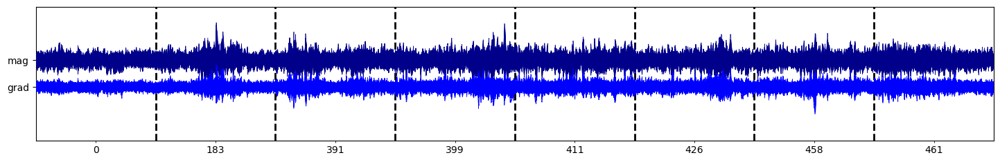

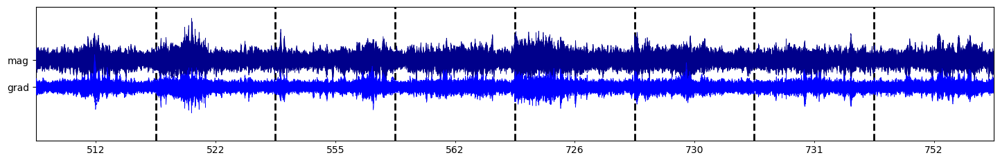


 --------------------- 
 oas_not_lwf(n = 2)
 --------------------- 
 


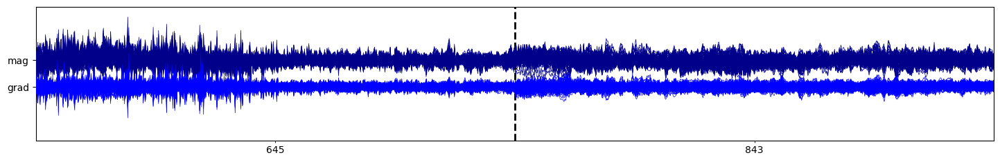


 --------------------- 
 lwf_and_oas(n = 39)
 --------------------- 
 


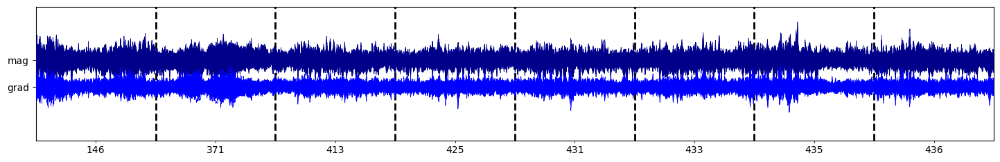

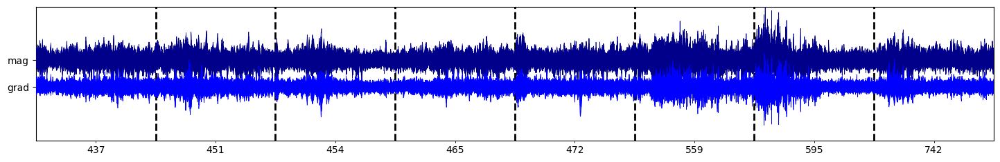

In [24]:
i=2
print(f'\n --------------------- \n lwf_not_oas (n = {len(lwf_not_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_not_oas[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n oas_not_lwf(n = {len(oas_not_lwf[i])})\n --------------------- \n ')
plot_epochs(epochs, oas_not_lwf[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n lwf_and_oas(n = {len(lwf_and_oas[i])})\n --------------------- \n ')
plot_epochs(epochs, lwf_and_oas[i], chunk_size=8, n_chunk_lims=[0, 2])

# Compare Potato (on mag only and grad only) and Potatofield

### subject 1

In [40]:
subjectID = subjectIDs[0]
epochs, idx_mag, idx_grad, idx_field, idx_mag_grad, idx_mag_only, idx_grad_only, idx_field_only = get_data_2(subjectID)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
List 0: LWF
	mag:		 44
	grad:		 40
	potatoField:	 114
	mag only:		 11
	grad only:		 7
	potatoField only:	 63
---
List 1: OAS
	mag:		 44
	grad:		 26
	potatoField:	 100
	mag only:		 22
	grad only:		 4
	potatoField o

LWF


 --------------------- 
 idx_field_only (n = 63)
 --------------------- 
 


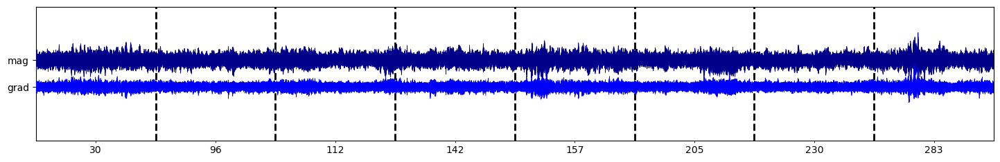

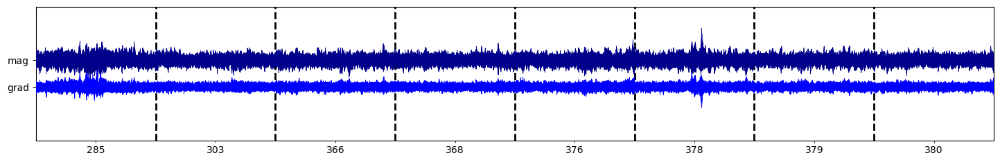


 --------------------- 
 idx_mag_only(n = 11)
 --------------------- 
 


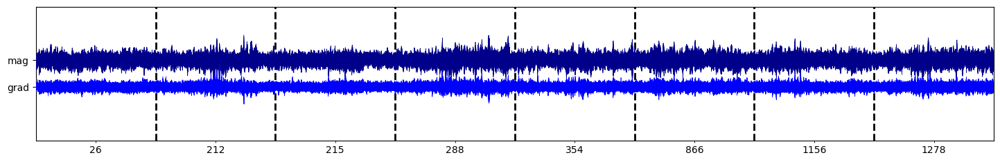

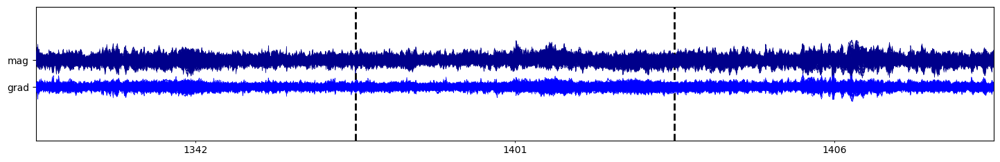


 --------------------- 
 idx_grad_only(n = 7)
 --------------------- 
 


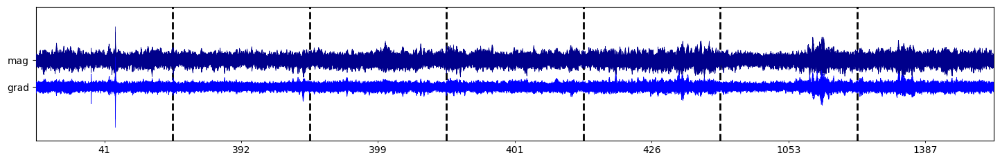


 --------------------- 
 idx_mag_grad(n = 51)
 --------------------- 
 


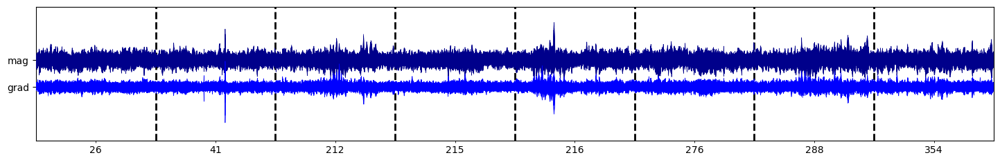

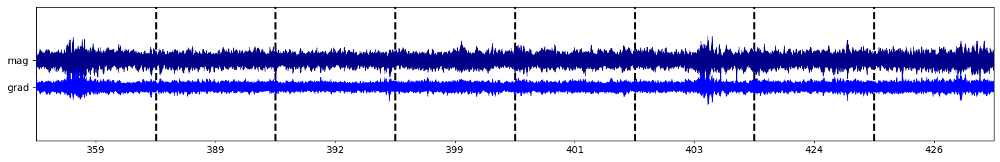

In [41]:
i=0
print(f'\n --------------------- \n idx_field_only (n = {len(idx_field_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_field_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_only(n = {len(idx_mag_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_grad_only(n = {len(idx_grad_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_grad_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_grad(n = {len(idx_mag_grad[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_grad[i], chunk_size=8, n_chunk_lims=[0, 2])


OAS


 --------------------- 
 idx_field_only (n = 52)
 --------------------- 
 


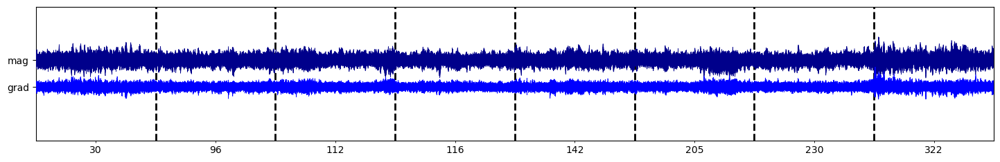

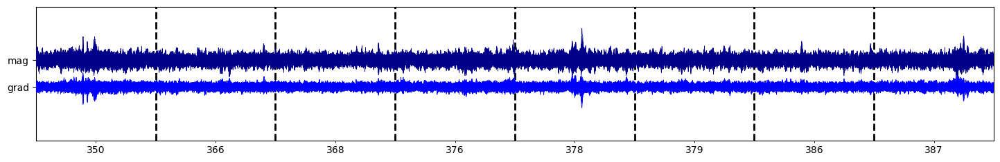


 --------------------- 
 idx_mag_only(n = 22)
 --------------------- 
 


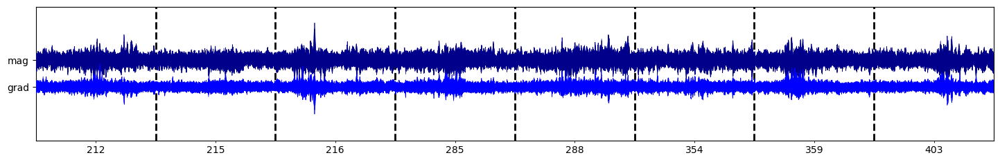

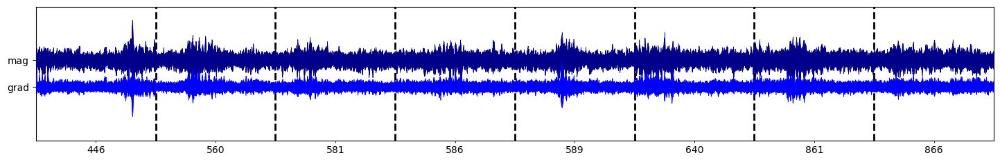


 --------------------- 
 idx_grad_only(n = 4)
 --------------------- 
 


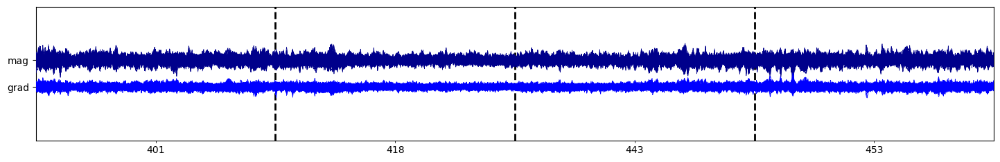


 --------------------- 
 idx_mag_grad(n = 48)
 --------------------- 
 


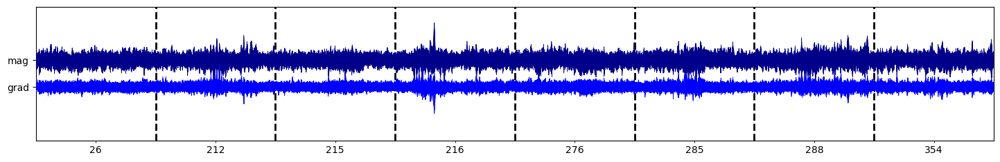

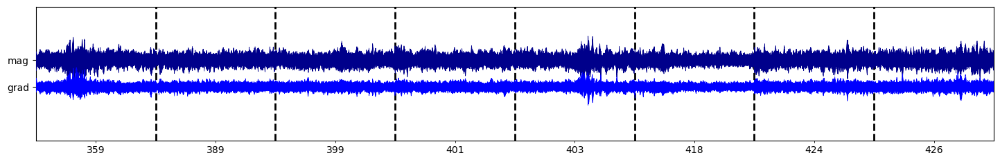

In [42]:
i=1
print(f'\n --------------------- \n idx_field_only (n = {len(idx_field_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_field_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_only(n = {len(idx_mag_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_grad_only(n = {len(idx_grad_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_grad_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_grad(n = {len(idx_mag_grad[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_grad[i], chunk_size=8, n_chunk_lims=[0, 2])


### subject 2

In [43]:
subjectID = subjectIDs[1]
epochs, idx_mag, idx_grad, idx_field, idx_mag_grad, idx_mag_only, idx_grad_only, idx_field_only = get_data_2(subjectID)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19960630cahi/19960630cahi_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19960630cahi/19960630cahi_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19960630cahi/19960630cahi_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
List 0: LWF
	mag:		 15
	grad:		 12
	potatoField:	 84
	mag only:		 6
	grad only:		 3
	potatoField only:	 66
---
List 1: OAS
	mag:		 15
	grad:		 11
	potatoField:	 80
	mag only:		 6
	grad only:		 2
	potatoField only:

LWF


 --------------------- 
 idx_field_only (n = 66)
 --------------------- 
 


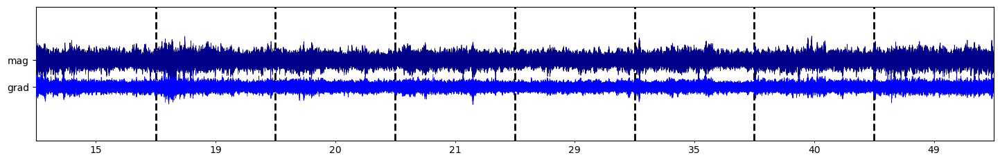

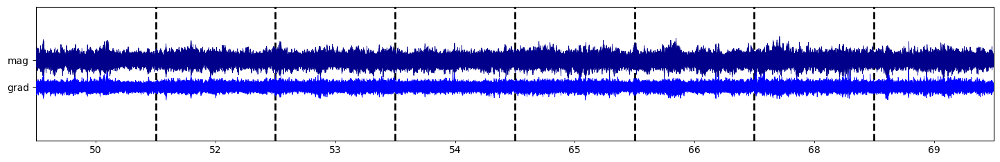


 --------------------- 
 idx_mag_only(n = 6)
 --------------------- 
 


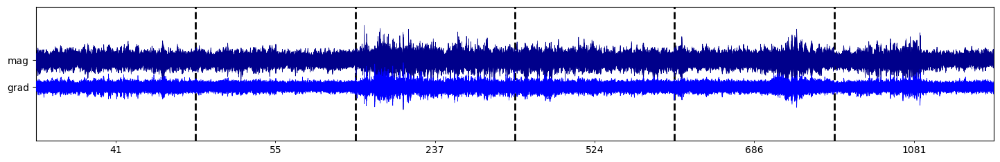


 --------------------- 
 idx_grad_only(n = 3)
 --------------------- 
 


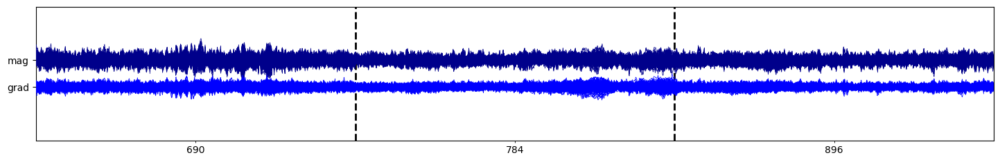


 --------------------- 
 idx_mag_grad(n = 18)
 --------------------- 
 


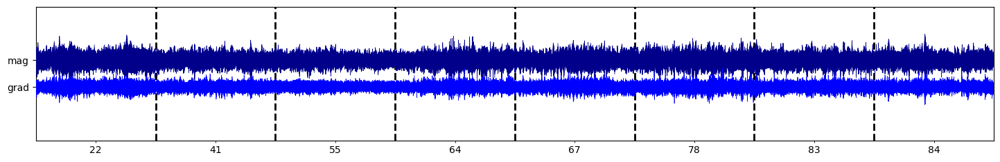

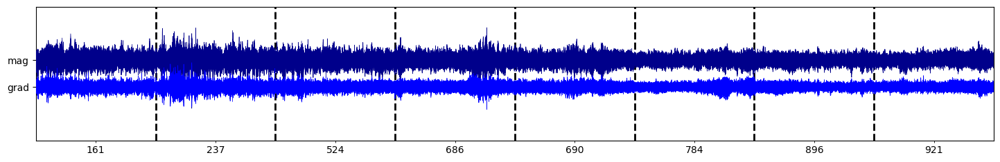

In [44]:
i=0
print(f'\n --------------------- \n idx_field_only (n = {len(idx_field_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_field_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_only(n = {len(idx_mag_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_grad_only(n = {len(idx_grad_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_grad_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_grad(n = {len(idx_mag_grad[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_grad[i], chunk_size=8, n_chunk_lims=[0, 2])


OAS


 --------------------- 
 idx_field_only (n = 63)
 --------------------- 
 


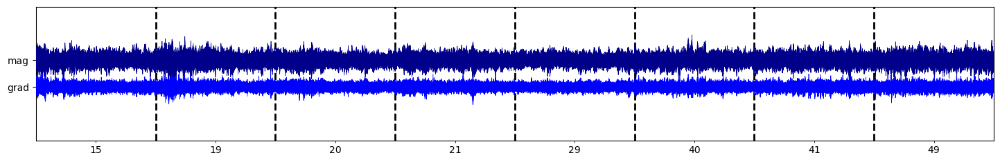

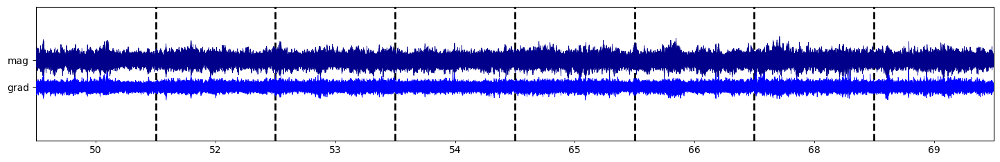


 --------------------- 
 idx_mag_only(n = 6)
 --------------------- 
 


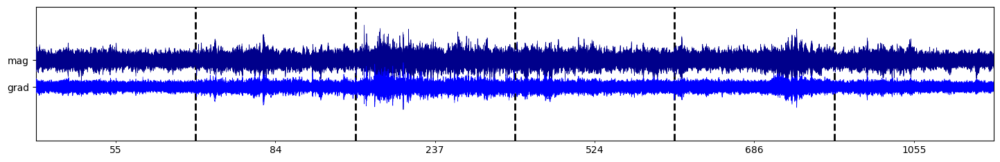


 --------------------- 
 idx_grad_only(n = 2)
 --------------------- 
 


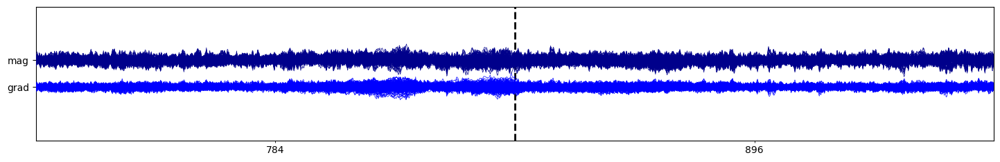


 --------------------- 
 idx_mag_grad(n = 17)
 --------------------- 
 


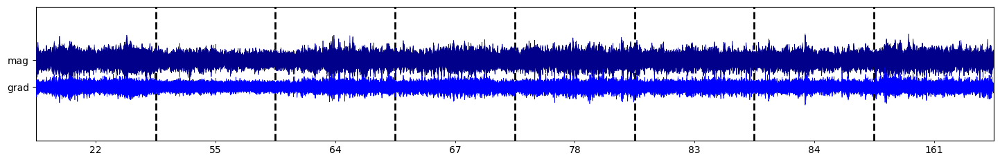

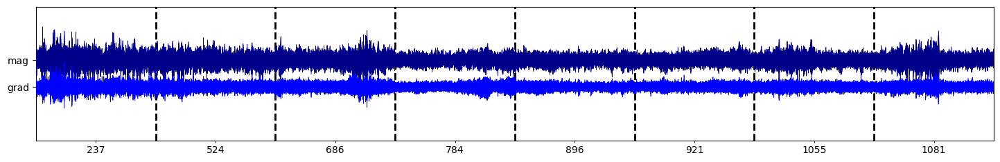

In [45]:
i=1
print(f'\n --------------------- \n idx_field_only (n = {len(idx_field_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_field_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_only(n = {len(idx_mag_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_grad_only(n = {len(idx_grad_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_grad_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_grad(n = {len(idx_mag_grad[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_grad[i], chunk_size=8, n_chunk_lims=[0, 2])


### subject 3

In [46]:
subjectID = subjectIDs[2]
epochs, idx_mag, idx_grad, idx_field, idx_mag_grad, idx_mag_only, idx_grad_only, idx_field_only = get_data_2(subjectID)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
List 0: LWF
	mag:		 71
	grad:		 60
	potatoField:	 132
	mag only:		 15
	grad only:		 4
	potatoField only:	 57
---
List 1: OAS
	mag:		 59
	grad:		 45
	potatoField:	 121
	mag only:		 16
	grad only:		 2
	potatoField o

LWF


 --------------------- 
 idx_field_only (n = 57)
 --------------------- 
 


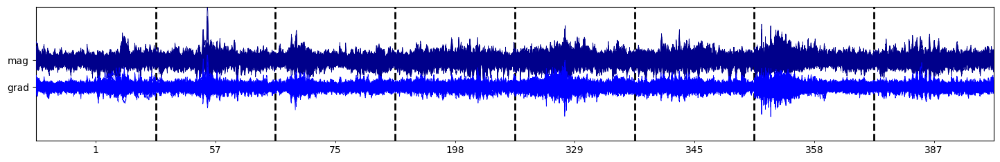

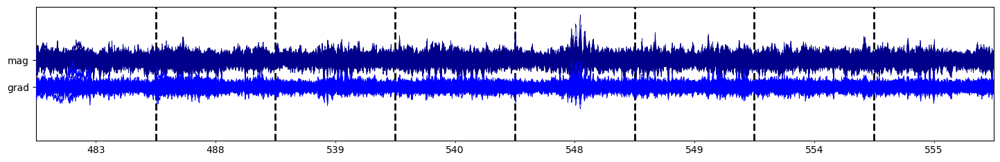


 --------------------- 
 idx_mag_only(n = 15)
 --------------------- 
 


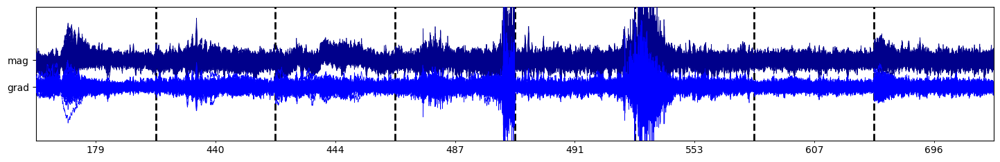

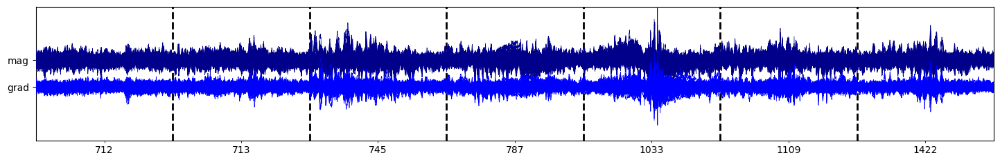


 --------------------- 
 idx_grad_only(n = 4)
 --------------------- 
 


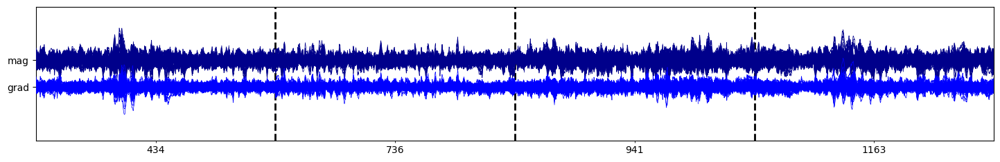


 --------------------- 
 idx_mag_grad(n = 75)
 --------------------- 
 


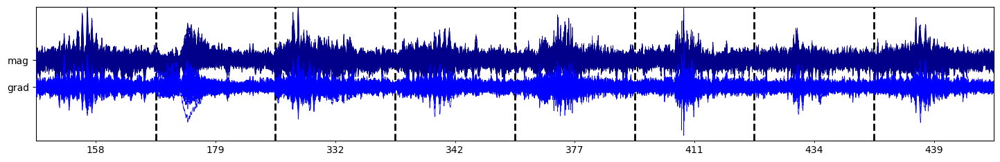

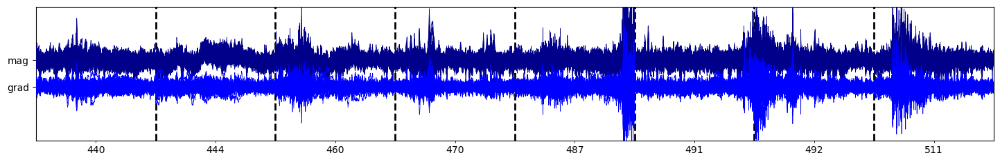

In [47]:
i=0
print(f'\n --------------------- \n idx_field_only (n = {len(idx_field_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_field_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_only(n = {len(idx_mag_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_grad_only(n = {len(idx_grad_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_grad_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_grad(n = {len(idx_mag_grad[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_grad[i], chunk_size=8, n_chunk_lims=[0, 2])


OAS


 --------------------- 
 idx_field_only (n = 60)
 --------------------- 
 


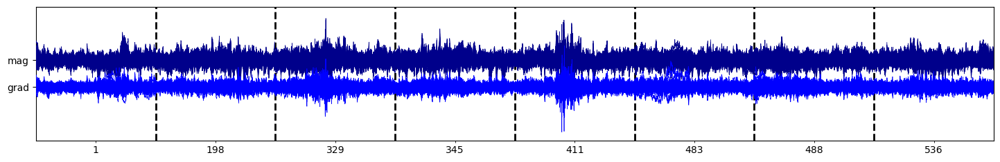

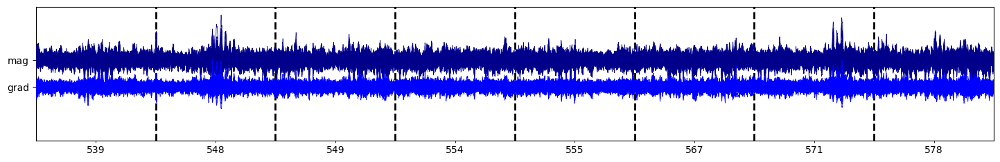


 --------------------- 
 idx_mag_only(n = 16)
 --------------------- 
 


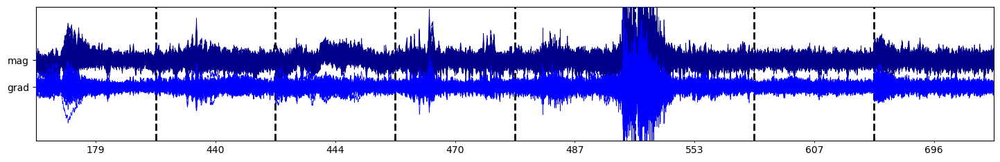

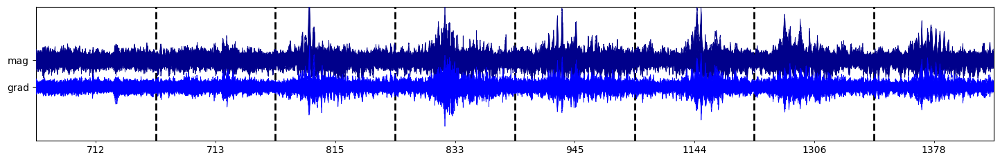


 --------------------- 
 idx_grad_only(n = 2)
 --------------------- 
 


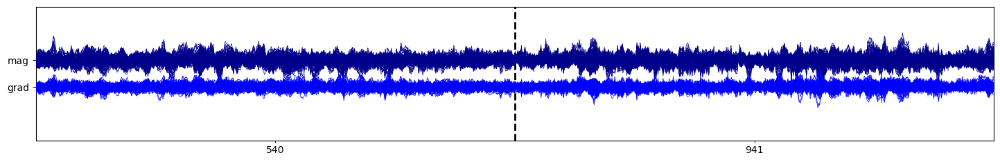


 --------------------- 
 idx_mag_grad(n = 61)
 --------------------- 
 


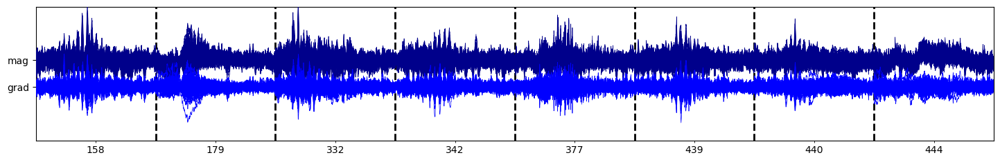

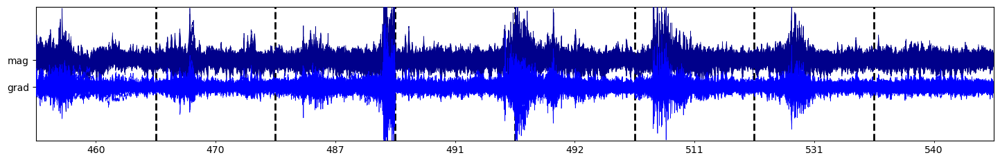

In [48]:
i=1
print(f'\n --------------------- \n idx_field_only (n = {len(idx_field_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_field_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_only(n = {len(idx_mag_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_grad_only(n = {len(idx_grad_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_grad_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_grad(n = {len(idx_mag_grad[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_grad[i], chunk_size=8, n_chunk_lims=[0, 2])


### subject 4

In [49]:
subjectID = subjectIDs[3]
epochs, idx_mag, idx_grad, idx_field, idx_mag_grad, idx_mag_only, idx_grad_only, idx_field_only = get_data_2(subjectID)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20000118sbnb/20000118sbnb_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20000118sbnb/20000118sbnb_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20000118sbnb/20000118sbnb_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
List 0: LWF
	mag:		 74
	grad:		 70
	potatoField:	 159
	mag only:		 16
	grad only:		 12
	potatoField only:	 73
---
List 1: OAS
	mag:		 65
	grad:		 41
	potatoField:	 141
	mag only:		 25
	grad only:		 1
	potatoField 

LWF


 --------------------- 
 idx_field_only (n = 73)
 --------------------- 
 


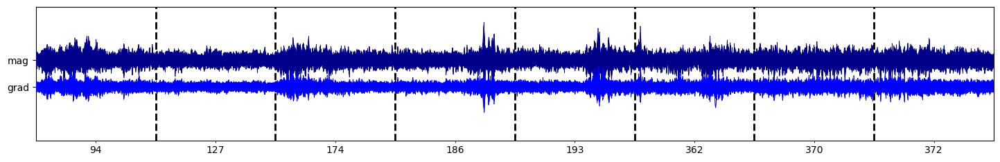

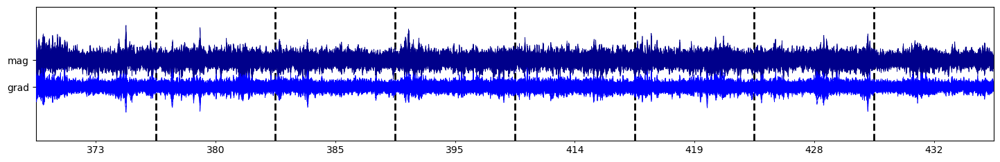


 --------------------- 
 idx_mag_only(n = 16)
 --------------------- 
 


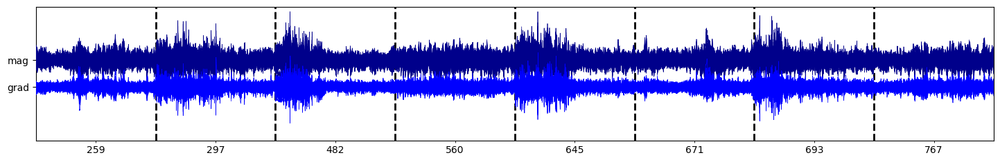

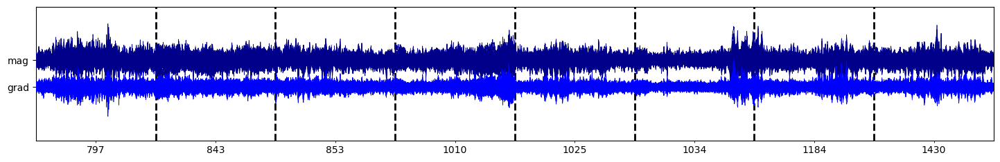


 --------------------- 
 idx_grad_only(n = 12)
 --------------------- 
 


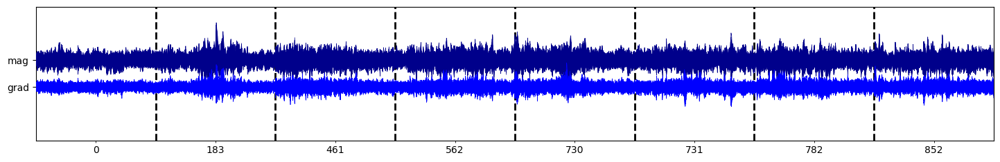

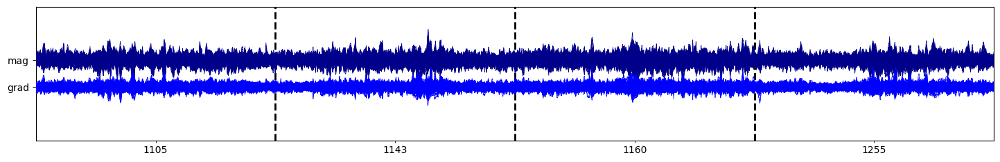


 --------------------- 
 idx_mag_grad(n = 86)
 --------------------- 
 


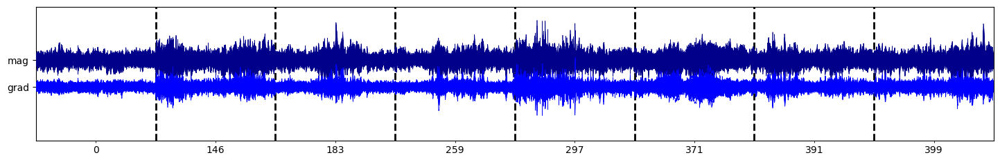

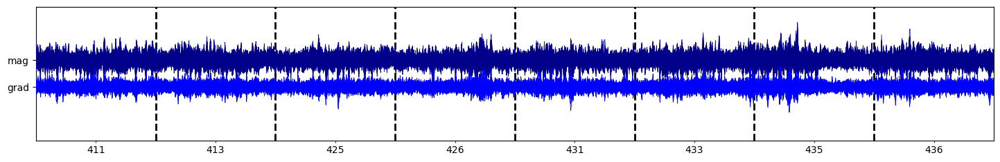

In [50]:
i=0
print(f'\n --------------------- \n idx_field_only (n = {len(idx_field_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_field_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_only(n = {len(idx_mag_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_grad_only(n = {len(idx_grad_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_grad_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_grad(n = {len(idx_mag_grad[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_grad[i], chunk_size=8, n_chunk_lims=[0, 2])


OAS


 --------------------- 
 idx_field_only (n = 75)
 --------------------- 
 


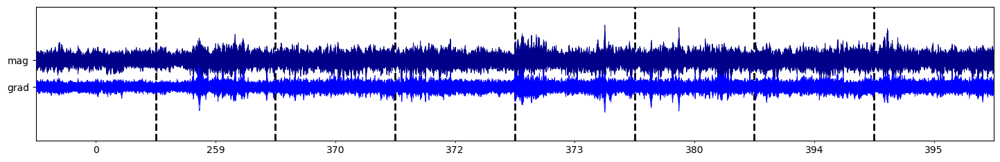

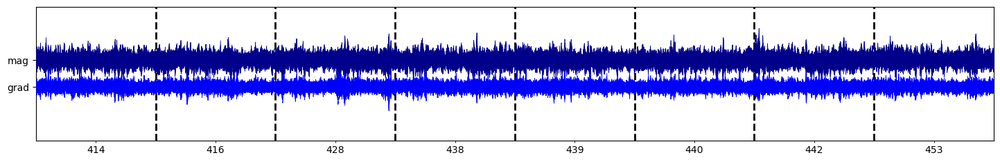


 --------------------- 
 idx_mag_only(n = 25)
 --------------------- 
 


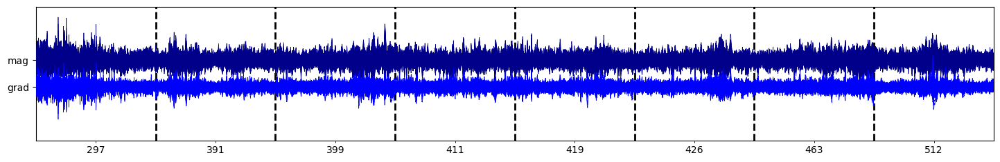

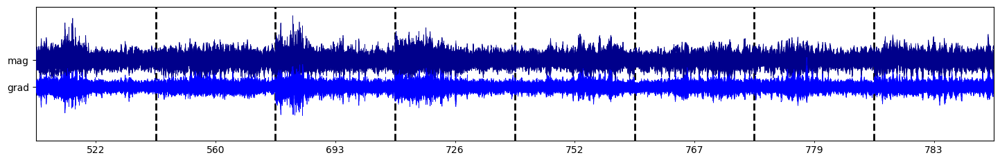


 --------------------- 
 idx_grad_only(n = 1)
 --------------------- 
 


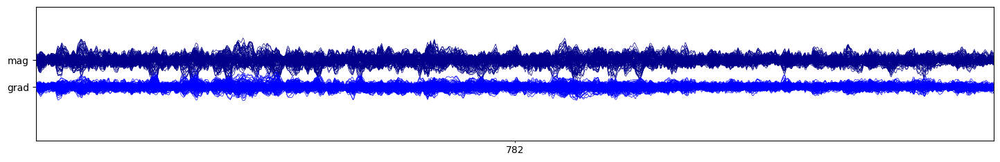


 --------------------- 
 idx_mag_grad(n = 66)
 --------------------- 
 


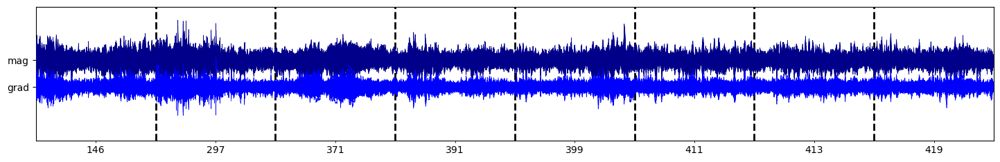

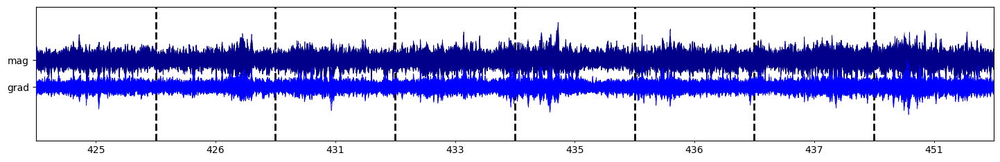

In [51]:
i=1
print(f'\n --------------------- \n idx_field_only (n = {len(idx_field_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_field_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_only(n = {len(idx_mag_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_grad_only(n = {len(idx_grad_only[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_grad_only[i], chunk_size=8, n_chunk_lims=[0, 2])
print(f'\n --------------------- \n idx_mag_grad(n = {len(idx_mag_grad[i])})\n --------------------- \n ')
plot_epochs(epochs, idx_mag_grad[i], chunk_size=8, n_chunk_lims=[0, 2])


# Compare different PotatoFiled z-thres and p-thres options

In [20]:
z_thres = [3, 3, 3.5, 4]
p_thres = [0.01, 0.001, 0.01, 0.01]
sep_line = '-----------------------------------------------------'

### subject 1

In [ ]:
subjectID = subjectIDs[0]
epochs, idx_lwf, idx_oas = get_data_3(subjectID)

##### LWF

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_lwf):
	print(f'\n {sep_line} \n LWF: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

##### OAS

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_oas):
	print(f'\n {sep_line} \n OAS: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

### subject 2

In [ ]:
subjectID = subjectIDs[1]
epochs, idx_lwf, idx_oas = get_data_3(subjectID)

##### LWF

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_lwf):
	print(f'\n {sep_line} \n LWF: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

##### OAS

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_oas):
	print(f'\n {sep_line} \n OAS: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

### subject 3

In [ ]:
subjectID = subjectIDs[2]
epochs, idx_lwf, idx_oas = get_data_3(subjectID)

##### LWF

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_lwf):
	print(f'\n {sep_line} \n LWF: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

##### OAS

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_oas):
	print(f'\n {sep_line} \n OAS: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

### subject 4

In [ ]:
subjectID = subjectIDs[3]
epochs, idx_lwf, idx_oas = get_data_3(subjectID)

##### LWF

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_lwf):
	print(f'\n {sep_line} \n LWF: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

##### OAS

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_oas):
	print(f'\n {sep_line} \n OAS: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

# tmp test

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/19840930bigs/19840930bigs_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
LWF:
	[0]: z = z_thres: 3	 p = p_thres: 0.01:		 114
	[

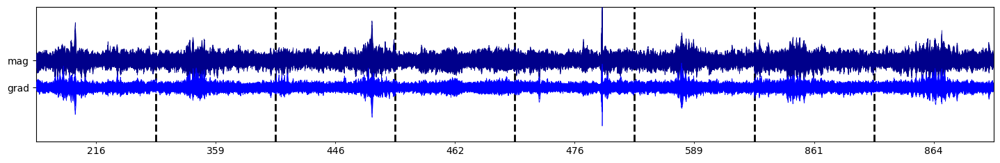

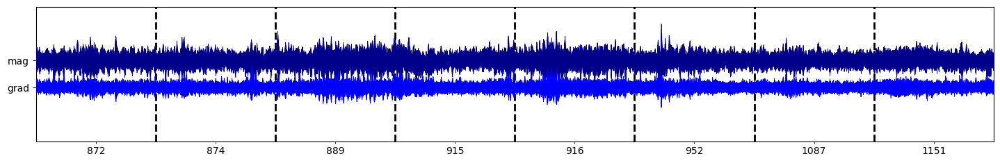

In [ ]:
subjectID = subjectIDs[0]
epochs, idx_lwf, idx_oas = get_data_3(subjectID, fileNr=4)
inFile =f'{CODE_DIR}/tmp_potatos_output_4.pkl'
data = joblib.load(inFile)

opt_idx = 3
opt = data[subjectID]['info'][opt_idx]
info = data[subjectID]['settings'][opt_idx]

# bad_idx = opt['bad_idx']
bad_idx = idx_lwf[opt_idx]

print('---------------------')
print(info)
print(f"length of bad_idx: {len(bad_idx)}")
print('---------------------')

z_scores = [opt['z_scores'][bad_i] for bad_i in bad_idx]
p_scores = [opt['clean_probability'][bad_i] for bad_i in bad_idx]

plot_epochs(epochs, bad_idx, chunk_size=8, n_chunk_lims=[0, 2])

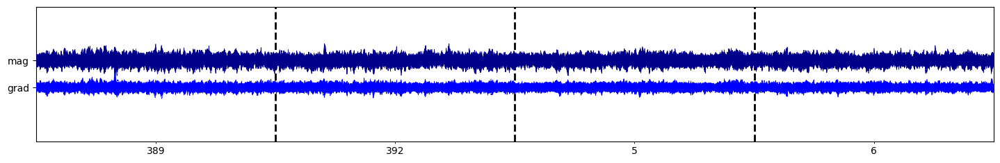

In [21]:
plot_epochs(epochs, [389, 392, 5, 6], chunk_size=8, n_chunk_lims=[0, 2])

Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_icaTest/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
LWF:
	[0]: z = z_thres: 3	 p = p_thres: 0.01:		 132
	[1]: z = z_thres: 4	 p = p_thres: 0.001:		 77
	[2]: z = z_thres: 4	 p = p_thres: 0.001:		 30
	[3]: z = z_thres: 4	 p = p_thres: 0.001:		 36
---
OAS:
	[0]: z = z

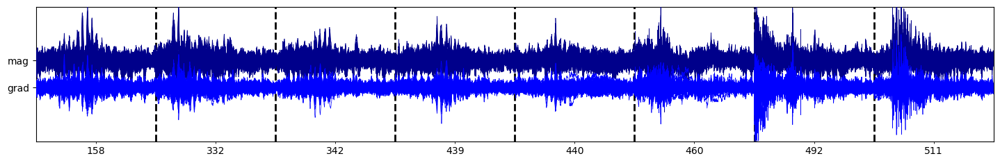

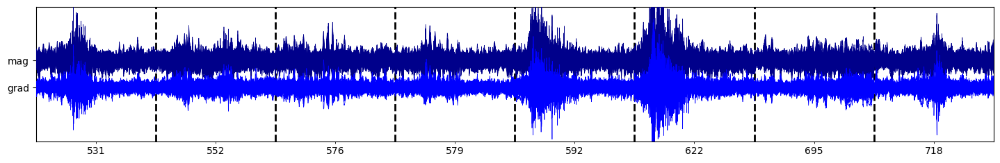

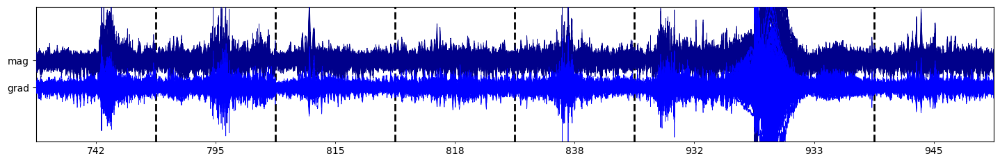

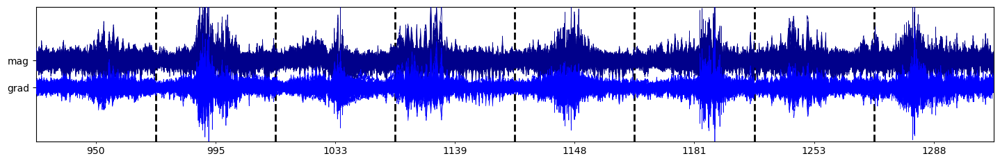

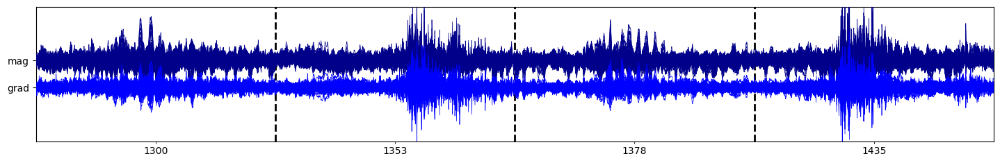

In [ ]:
subjectID = subjectIDs[2]
epochs, idx_lwf, idx_oas = get_data_3(subjectID, fileNr=4)
inFile =f'{CODE_DIR}/tmp_potatos_output_4.pkl'
data = joblib.load(inFile)

opt_idx = 3
opt = data[subjectID]['info'][opt_idx]
info = data[subjectID]['settings'][opt_idx]

# bad_idx = opt['bad_idx']
bad_idx = idx_lwf[opt_idx]

print('---------------------')
print(info)
print(f"length of bad_idx: {len(bad_idx)}")
print('---------------------')

z_scores = [opt['z_scores'][bad_i] for bad_i in bad_idx]
p_scores = [opt['clean_probability'][bad_i] for bad_i in bad_idx]

plot_epochs(epochs, bad_idx, chunk_size=8, n_chunk_lims=[0, 8])

In [ ]:
subjectID = subjectIDs[0]
epochs, idx_lwf, idx_oas = get_data_3(subjectID)

##### LWF

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_lwf):
	print(f'\n {sep_line} \n LWF: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_lwf[i1], idx_lwf[i2])[0]
print(f'\n {sep_line} \n LWF: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

##### OAS

In [ ]:
for z, p, idx in zip(z_thres, p_thres, idx_oas):
	print(f'\n {sep_line} \n OAS: z-thres = {z}\t p_thres = {p}\t (n = {len(idx)})\n {sep_line} \n ')
	plot_epochs(epochs, idx, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 0
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

i1 = 2
i2 = 3
idx_new = _in1not2(idx_oas[i1], idx_oas[i2])[0]
print(f'\n {sep_line} \n OAS: z = {z_thres[i2]}, p = {p_thres[i2]}    not in    z = {z_thres[i1]}, p = {p_thres[i1]} (n = {len(idx_new)})\n {sep_line} \n ')
plot_epochs(epochs, idx_new, chunk_size=8, n_chunk_lims=[0, 2])

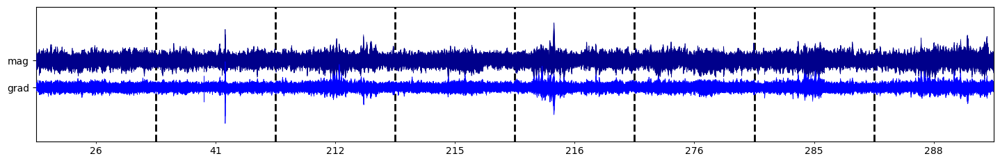

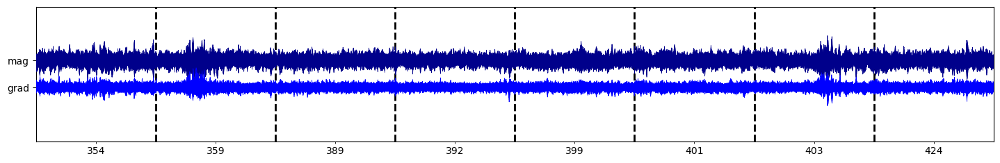

In [6]:
idx_tmp = [26, 41, 212, 215, 216, 276, 285, 288, 354, 359, 389, 392, 399, 401, 403, 424, 426, 446, 453, 462, 476, 479, 521, 560, 581, 586, 589, 624, 640, 769, 861, 864, 866, 872, 874, 889, 911, 915, 916, 938, 945, 952, 1053, 1087, 1151, 1156, 1183, 1278, 1347, 1387, 1397, 1401, 1406]
plot_epochs(epochs, idx_tmp, chunk_size=8, n_chunk_lims=[0, 2])

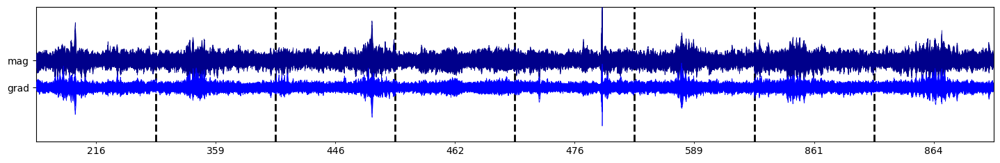

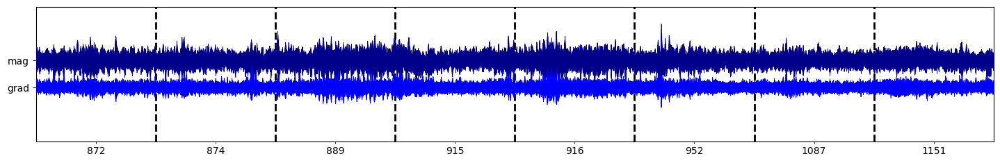

In [7]:
idx_tmp = [216, 359, 446, 462, 476, 589, 861, 864, 872, 874, 889, 915, 916, 952, 1087, 1151, 1347, 1397]
plot_epochs(epochs, idx_tmp, chunk_size=8, n_chunk_lims=[0, 2])

In [ ]:
idx_tmp = 
plot_epochs(epochs, idx_tmp, chunk_size=8, n_chunk_lims=[0, 2])

In [ ]:
idx_tmp = 
plot_epochs(epochs, idx_tmp, chunk_size=8, n_chunk_lims=[0, 2])

## subj 1

Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
LWF:
	[0]: z = z_thres: 3	 p = p_thres: 0.01:		 132
	[1]: z = z_th

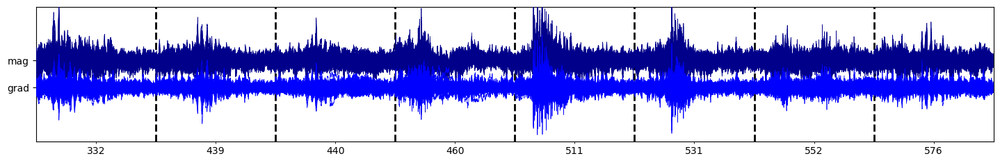

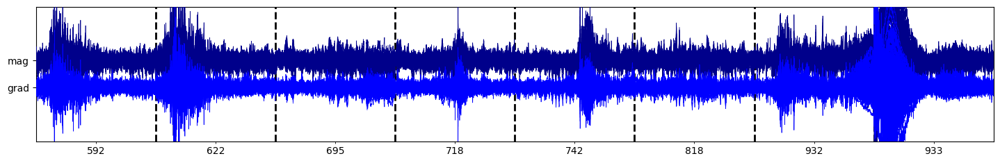

In [ ]:
subjectID = subjectIDs[0]
epochs, idx_lwf, idx_oas = get_data_3(subjectID, fileNr=4)
inFile =f'{CODE_DIR}/tmp_potatos_output_4.pkl'
data = joblib.load(inFile)

opt_idx = 3
opt = data[subjectID]['info'][opt_idx]
# info = data[subjectID]['settings'][opt_idx]

# bad_idx = opt['bad_idx']
bad_idx = idx_oas[opt_idx]
info = data[subjectID]['settings'][opt_idx-1]
print('---------------------')
print(info)
print(f"length of bad_idx: {len(bad_idx)}")
print('---------------------')

z_scores = [opt['z_scores'][bad_i] for bad_i in bad_idx]
p_scores = [opt['clean_probability'][bad_i] for bad_i in bad_idx]

plot_epochs(epochs, bad_idx, chunk_size=8, n_chunk_lims=[0, 2])

Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
LWF:
	[0]: z = z_thres: 3	 p = p_thres: 0.01:		 132
	[1]: z = z_thres: 4	 p = p_thres: 0.001:		 77
	[2]: z = z_thres: 4	 p = p_thres: 0.001:		 30
	[3]: z = z_thres: 4	 p = p_thres: 0.001:		 36
---
OAS:
	[0]: z = z_thres: 

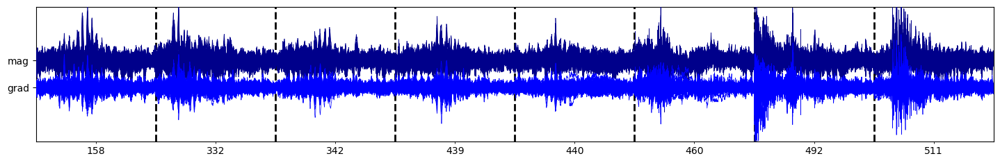

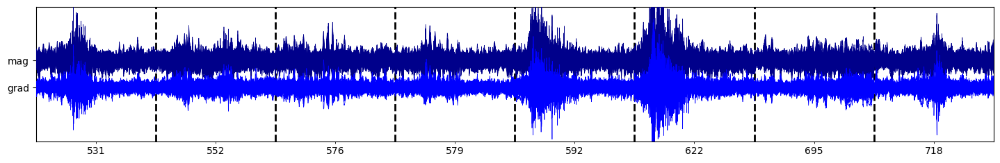

In [ ]:
subjectID = subjectIDs[2]
epochs, idx_lwf, idx_oas = get_data_3(subjectID, fileNr=4)
inFile =f'{CODE_DIR}/tmp_potatos_output_4.pkl'
data = joblib.load(inFile)

opt_idx = 3
opt = data[subjectID]['info'][opt_idx]
# info = data[subjectID]['settings'][opt_idx]

# bad_idx = opt['bad_idx']
bad_idx = idx_lwf[opt_idx]
info = data[subjectID]['settings'][opt_idx-1]
print('---------------------')
print(info)
print(f"length of bad_idx: {len(bad_idx)}")
print('---------------------')

z_scores = [opt['z_scores'][bad_i] for bad_i in bad_idx]
p_scores = [opt['clean_probability'][bad_i] for bad_i in bad_idx]

plot_epochs(epochs, bad_idx, chunk_size=8, n_chunk_lims=[0, 2])

Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo.fif ...


    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-1.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_ica/20021027sldn/20021027sldn_maxfilter_True__ica_True__0.5-99Hz__fs_1000__[-1.5_1.5]s_meg-epo-2.fif ...
    Found the data of interest:
        t =   -1500.00 ...    1500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated
LWF:
	[0]: z = z_thres: 3	 p = p_thres: 0.01:		 132
	[1]: z = z_thres: 3.5	 p = p_thres: 0.001:		 36
	[2]: z = z_thres: 3	 p = p_thres: 0.001:		 60
	[3]: z = z_thres: 3	 p = p_thres: 0.001:		 71
---
OAS:
	[0]: z = z_thres

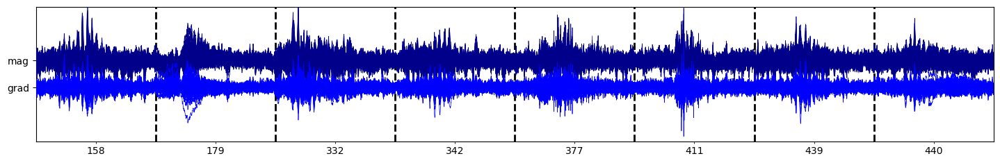

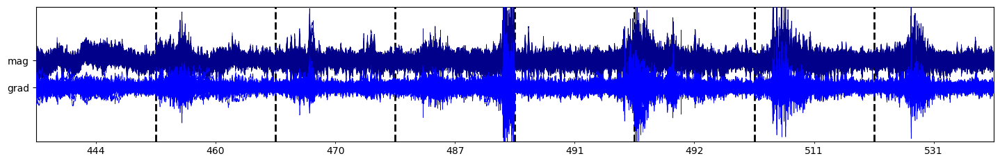

In [ ]:
subjectID = subjectIDs[2]
epochs, idx_lwf, idx_oas = get_data_3(subjectID, fileNr=5)
inFile =f'{CODE_DIR}/tmp_potatos_output_5.pkl'
data = joblib.load(inFile)

opt_idx = 3

opt = data[subjectID]['info'][opt_idx]
info = data[subjectID]['settings'][opt_idx-1]

# bad_idx = opt['bad_idx']
bad_idx = idx_lwf[opt_idx]

print('---------------------')
print(info)
print(f"length of bad_idx: {len(bad_idx)}")
print('---------------------')

z_scores = [opt['z_scores'][bad_i] for bad_i in bad_idx]
p_scores = [opt['clean_probability'][bad_i] for bad_i in bad_idx]

plot_epochs(epochs, bad_idx, chunk_size=8, n_chunk_lims=[0, 2])